In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel('Heart Disease.xlsx')
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3,30,No,Female,55-59,White,Yes,Yes,Very good,5,Yes,No,Yes
1,No,20.34,No,No,Yes,0,0,No,Female,80 or older,White,No,Yes,Very good,7,No,No,No
2,No,26.58,Yes,No,No,20,30,No,Male,65-69,White,Yes,Yes,Fair,8,Yes,No,No
3,No,24.21,No,No,No,0,0,No,Female,75-79,White,No,No,Good,6,No,No,Yes
4,No,23.71,No,No,No,28,0,Yes,Female,40-44,White,No,Yes,Very good,8,No,No,No


In [3]:
df.shape
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  int64  
 6   MentalHealth      319795 non-null  int64  
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  int64  
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [4]:
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [5]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
319790    False
319791    False
319792    False
319793    False
319794    False
Length: 319795, dtype: bool

<Axes: xlabel='Smoking', ylabel='count'>

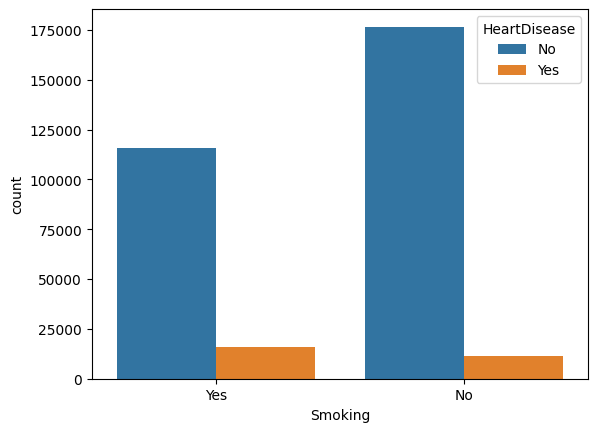

In [6]:
sns.countplot(x='Smoking',hue='HeartDisease',data=df)

# NB: The Dataset is not balanced.

In [7]:
data = df[df['HeartDisease']=='Yes']
data

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
5,Yes,28.87,Yes,No,No,6,0,Yes,Female,75-79,Black,No,No,Fair,12,No,No,No
10,Yes,34.30,Yes,No,No,30,0,Yes,Male,60-64,White,Yes,No,Poor,15,Yes,No,No
35,Yes,32.98,Yes,No,Yes,10,0,Yes,Male,75-79,White,Yes,Yes,Poor,4,No,No,Yes
42,Yes,25.06,No,No,No,0,0,Yes,Female,80 or older,White,Yes,No,Good,7,No,No,Yes
43,Yes,30.23,Yes,No,No,6,2,Yes,Female,75-79,White,Yes,Yes,Fair,8,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319765,Yes,38.45,No,No,Yes,30,15,Yes,Female,55-59,Hispanic,Yes,Yes,Poor,6,Yes,No,No
319767,Yes,36.21,Yes,No,No,0,0,Yes,Female,75-79,Hispanic,Yes,Yes,Good,8,No,No,No
319781,Yes,37.12,Yes,No,No,0,0,No,Male,35-39,Hispanic,No,Yes,Very good,7,No,No,No
319786,Yes,33.20,Yes,No,No,0,0,No,Female,60-64,Hispanic,Yes,Yes,Very good,8,Yes,No,No


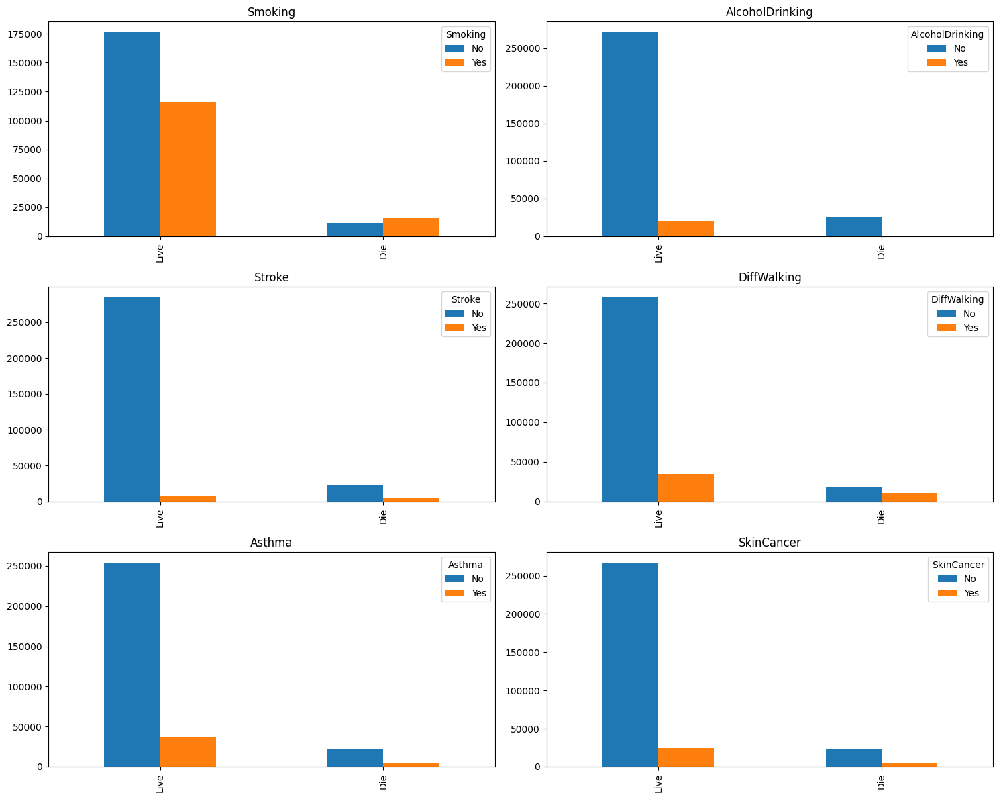

In [8]:
def bar_chart(feature, ax):
    live = df[df['HeartDisease'] == 'No'][feature].value_counts()
    die = df[df['HeartDisease'] == 'Yes'][feature].value_counts()
    df1 = pd.DataFrame([live, die])
    df1.index = ['Live', 'Die']
    df1.plot(kind='bar', ax=ax)
    ax.set_title(feature)

# Gom nhóm các biểu đồ bar
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
features = ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Asthma', 'SkinCancer']
for i, feature in enumerate(features):
    bar_chart(feature, axes[i // 2, i % 2])

plt.tight_layout()
plt.show()

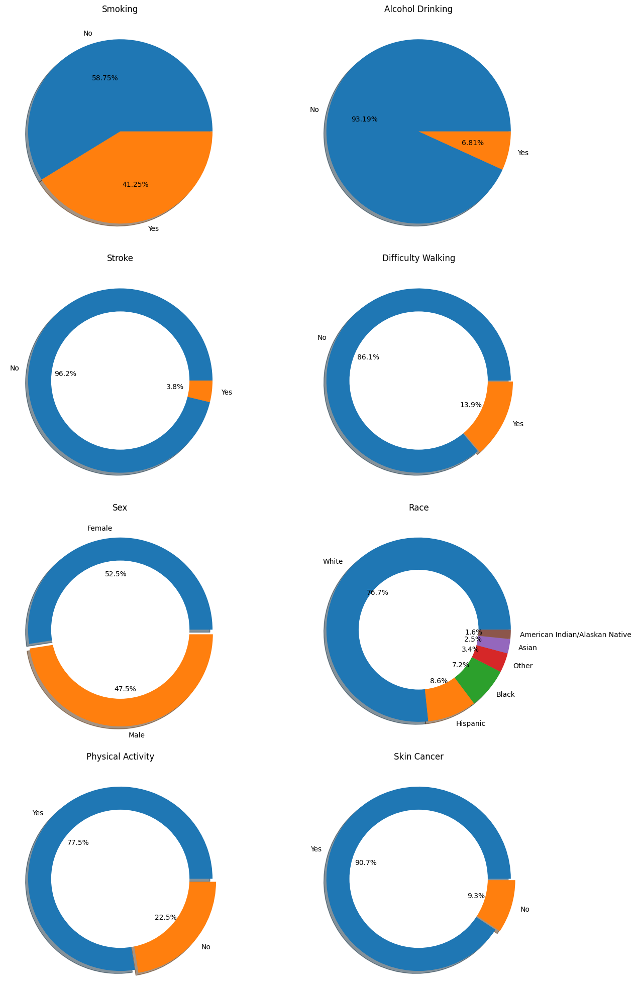

In [9]:
labels_smoke = ["No", "Yes"]
smoke = df['Smoking'].value_counts()

labels_alcohol = ["No", "Yes"]
AlcoholDrinking = df['AlcoholDrinking'].value_counts()

labels_stroke = ["No", "Yes"]
Stroke = df['Stroke'].value_counts()

labels_diffwalking = ["No", "Yes"]
DiffWalking = df['DiffWalking'].value_counts()

labels_sex = ["Female", "Male"]
Sex = df['Sex'].value_counts()

labels_race = ["White", "Hispanic", "Black", "Other", "Asian", "American Indian/Alaskan Native"]
Race = df['Race'].value_counts()

labels_physical = ["Yes", "No"]
PhysicalActivity = df['PhysicalActivity'].value_counts()

labels_skincancer = ["Yes", "No"]
SkinCancer = df['SkinCancer'].value_counts()

# Plotting
fig, axs = plt.subplots(4, 2, figsize=(15, 20))  # 4 rows, 2 columns

# Smoking
axs[0, 0].pie(smoke, labels=labels_smoke, autopct='%2.2f%%', shadow=True)
axs[0, 0].set_title("Smoking")

# Alcohol Drinking
axs[0, 1].pie(AlcoholDrinking, labels=labels_alcohol, autopct='%2.2f%%', shadow=True)
axs[0, 1].set_title("Alcohol Drinking")

# Stroke
axs[1, 0].pie(Stroke, labels=labels_stroke, autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.75, facecolor='white')
axs[1, 0].add_artist(circle)
axs[1, 0].set_title("Stroke")

# Difficulty Walking
axs[1, 1].pie(DiffWalking, labels=labels_diffwalking, explode=[0, 0.025], autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.75, facecolor='white')
axs[1, 1].add_artist(circle)
axs[1, 1].set_title("Difficulty Walking")

# Sex
axs[2, 0].pie(Sex, labels=labels_sex, explode=[0, 0.05], autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.75, facecolor='white')
axs[2, 0].add_artist(circle)
axs[2, 0].set_title("Sex")

# Race
axs[2, 1].pie(Race, labels=labels_race, autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.65, facecolor='white')
axs[2, 1].add_artist(circle)
axs[2, 1].set_title("Race")

# Physical Activity
axs[3, 0].pie(PhysicalActivity, labels=labels_physical, explode=[0, 0.05], autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.75, facecolor='white')
axs[3, 0].add_artist(circle)
axs[3, 0].set_title("Physical Activity")

# Skin Cancer
axs[3, 1].pie(SkinCancer, labels=labels_skincancer, explode=[0, 0.05], autopct='%2.1f%%', shadow=True)
circle = plt.Circle(xy=(0, 0), radius=0.75, facecolor='white')
axs[3, 1].add_artist(circle)
axs[3, 1].set_title("Skin Cancer")

# Adjust layout
plt.tight_layout()
plt.show()

#What is KDE?
In statistics, kernel density estimation (KDE) is the application of kernel smoothing for probability density estimation, i.e., a non-parametric method to estimate the probability density function of a random variable based on kernels as weights.

<Figure size 1500x1000 with 0 Axes>

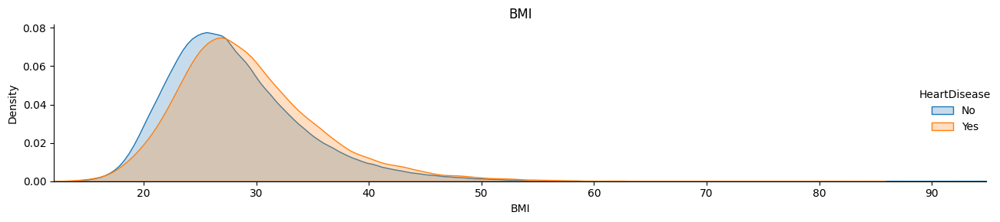

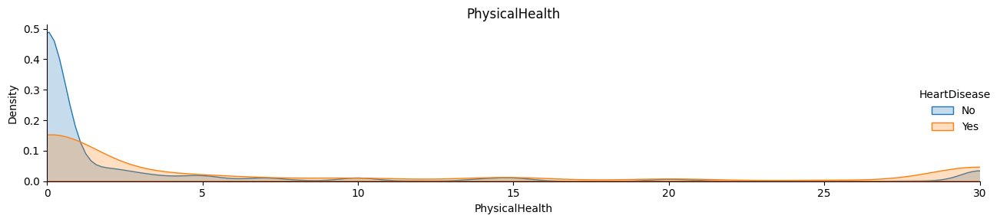

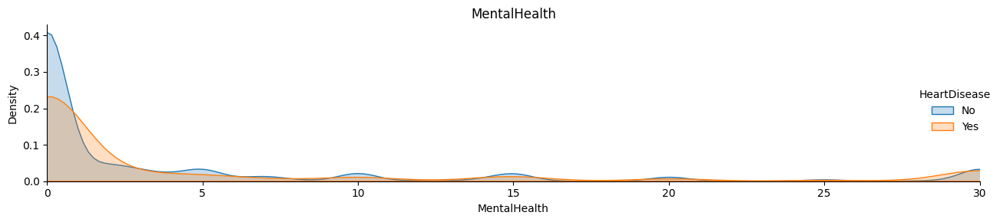

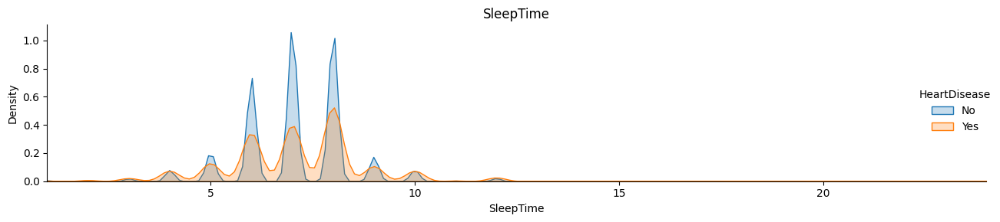

In [10]:
# KDE PLOTS
def plot_multiple_kdes(features, rows, cols, figsize=(15, 10)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    for i, feature in enumerate(features):
        facet = sns.FacetGrid(df, hue="HeartDisease", aspect=4, height=3)
        facet.map(sns.kdeplot, feature, shade=True)
        facet.set(xlim=(df[feature].min(), df[feature].max()))
        facet.add_legend()
        facet.ax.set_title(f'{feature}')
        facet.ax.figure.tight_layout()
        axes[i].remove()
    plt.show()

kde_features = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
plot_multiple_kdes(kde_features, rows=2, cols=2)

<Axes: xlabel='BMI', ylabel='Density'>

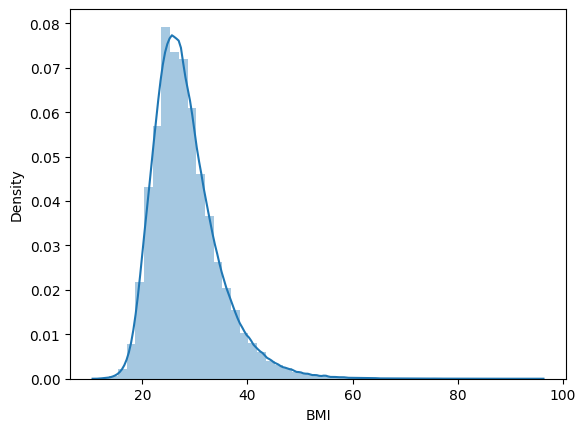

In [11]:
sns.distplot(df['BMI']) #A Distplot or distribution plot, depicts the variation in the data distribution.

# Data preprocessing for balancing


In [12]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_absolute_error, accuracy_score
from sklearn.preprocessing import LabelEncoder

In [13]:
# Sử dụng LabelEncoder để mã hóa các cột phân loại (categorical)
le = LabelEncoder()

In [14]:
# Danh sách các cột cần mã hóa
list = ['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex', 
        'AgeCategory', 'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 
        'Asthma', 'KidneyDisease', 'SkinCancer']

# Áp dụng mã hóa từng cột
for i in list:
    df[i] = le.fit_transform(df[i])

In [15]:
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3,30,0,0,7,5,2,1,4,5,1,0,1
1,0,20.34,0,0,1,0,0,0,0,12,5,0,1,4,7,0,0,0
2,0,26.58,1,0,0,20,30,0,1,9,5,2,1,1,8,1,0,0
3,0,24.21,0,0,0,0,0,0,0,11,5,0,0,2,6,0,0,1
4,0,23.71,0,0,0,28,0,1,0,4,5,0,1,4,8,0,0,0


In [16]:
# Tách dữ liệu thành biến đầu vào (x) và biến mục tiêu (y)
x = df.drop(columns=['HeartDisease'])
y = df['HeartDisease']

In [17]:
x.sample(10)

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
236508,22.71,0,0,0,0,5,0,0,8,5,0,1,0,8,0,0,0
190153,23.06,0,0,0,2,2,0,1,5,1,0,1,0,8,0,0,0
69078,33.72,1,0,0,0,0,0,1,7,5,0,1,2,7,0,0,0
303113,25.24,1,0,0,0,15,0,1,8,5,0,0,2,7,0,0,0
71876,22.15,0,1,0,0,5,0,0,2,5,0,1,4,8,0,0,0
85105,31.87,0,0,0,0,0,0,1,6,5,0,1,2,8,0,0,0
310444,38.09,0,0,0,0,15,1,0,8,5,0,0,2,12,0,0,1
51668,20.80,1,0,0,0,0,0,0,2,5,0,1,4,7,0,0,0
243377,30.68,0,0,0,0,0,0,1,6,5,0,1,4,8,0,0,0
220406,22.81,1,0,0,0,0,0,1,12,5,0,1,2,8,0,0,0


# Undersampling

In [18]:
# Thực hiện giảm mẫu (undersampling) để cân bằng dữ liệu
from imblearn.under_sampling import NearMiss

In [19]:
# Tạo đối tượng NearMiss và áp dụng giảm mẫu
NearMiss_obj = NearMiss()
new_x, new_y = NearMiss_obj.fit_resample(x, y)

In [20]:
new_y

0        0
1        0
2        0
3        0
4        0
        ..
54741    1
54742    1
54743    1
54744    1
54745    1
Name: HeartDisease, Length: 54746, dtype: int64

In [21]:
new_y.value_counts()

HeartDisease
0    27373
1    27373
Name: count, dtype: int64

In [22]:
# Tạo DataFrame mới từ dữ liệu đã giảm mẫu
df2 = pd.DataFrame(new_x)
df2.head()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0
1,22.24,1,0,0,0,0,0,1,11,5,0,1,4,7,0,0,0
2,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0
3,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0
4,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0


In [23]:
df3=pd.DataFrame(new_y)
df3.head()

,HeartDisease
0,0
1,0
2,0
3,0
4,0


In [24]:
# Gộp dữ liệu x và y đã giảm mẫu thành một DataFrame duy nhất
df4 = pd.concat([df2, df3], axis=1)
df4

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0,0
1,22.24,1,0,0,0,0,0,1,11,5,0,1,4,7,0,0,0,0
2,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0,0
3,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0,0
4,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54741,38.45,0,0,1,30,15,1,0,7,3,2,1,3,6,1,0,0,1
54742,36.21,1,0,0,0,0,1,0,11,3,2,1,2,8,0,0,0,1
54743,37.12,1,0,0,0,0,0,1,3,3,0,1,4,7,0,0,0,1
54744,33.20,1,0,0,0,0,0,0,8,3,2,1,4,8,1,0,0,1


# Feature ranking

In [25]:
df4.nunique()

BMI                 2267
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             22
Asthma                 2
KidneyDisease          2
SkinCancer             2
HeartDisease           2
dtype: int64

In [26]:
# Đánh giá tầm quan trọng của các đặc trưng (feature importance) sử dụng ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier

In [27]:
# Tạo mô hình ExtraTreesClassifier và huấn luyện
extr = ExtraTreesClassifier()
extr.fit(new_x, new_y)

ExtraTreesClassifier()

In [28]:
# Lấy giá trị tầm quan trọng của từng đặc trưng
feature_importance = extr.feature_importances_
feature_importance

array([0.24254972, 0.008405  , 0.00696105, 0.03827748, 0.12597706,
       0.08767977, 0.10756472, 0.00620347, 0.03454004, 0.04360927,
       0.07551212, 0.06990281, 0.04580751, 0.03804683, 0.03733669,
       0.01993195, 0.0116945 ])

In [29]:
# Tạo DataFrame chứa các điểm tầm quan trọng
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp.head(10)

,Gain_Score
0,0.242550
1,0.008405
2,0.006961
3,0.038277
4,0.125977
5,0.087680
6,0.107565
7,0.006203
8,0.034540
9,0.043609


In [30]:
new_x.columns

Index(['BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth',
       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer'],
      dtype='object')

In [31]:
cols = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
cols.head(10)

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth
5,MentalHealth
6,DiffWalking
7,Sex
8,AgeCategory
9,Race


In [32]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,BMI,0.242550
1,Smoking,0.008405
2,AlcoholDrinking,0.006961
3,Stroke,0.038277
4,PhysicalHealth,0.125977
5,MentalHealth,0.087680
6,DiffWalking,0.107565
7,Sex,0.006203
8,AgeCategory,0.034540
9,Race,0.043609


In [33]:
newx = gains.nlargest(18,'Gain_Score')
newx

,Feature_Names,Gain_Score
0,BMI,0.242550
4,PhysicalHealth,0.125977
6,DiffWalking,0.107565
5,MentalHealth,0.087680
10,Diabetic,0.075512
11,PhysicalActivity,0.069903
12,GenHealth,0.045808
9,Race,0.043609
3,Stroke,0.038277
13,SleepTime,0.038047


<Axes: xlabel='Gain_Score', ylabel='Feature_Names'>

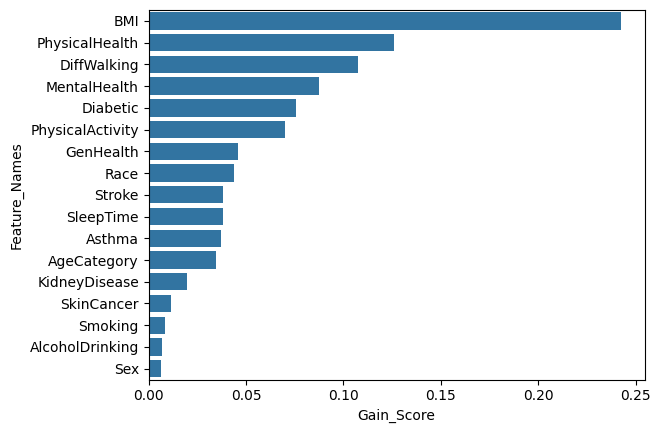

In [34]:
sns.barplot(x='Gain_Score',y='Feature_Names',data=newx)

<Axes: >

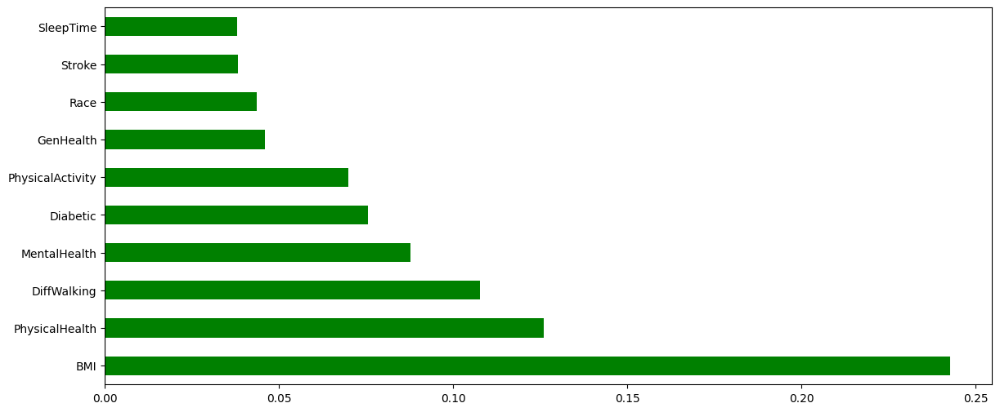

In [35]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(14,6))
features.nlargest(10).plot(kind='barh', color='g')

In [36]:
# Chọn đặc trưng tốt nhất bằng SelectKBest
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression #chi2 only when features are non negative

In [37]:
# Chỉ dùng chi2 khi dữ liệu không âm
model2 = SelectKBest(score_func=f_classif)

In [38]:
# Áp dụng SelectKBest để đánh giá các đặc trưng
feature_score = model2.fit(new_x, new_y)

In [39]:
feature_score.scores_

array([3.75440127e+03, 2.03552236e+03, 6.95297966e+02, 4.83533549e+03,
       1.25312036e+04, 6.96957949e+03, 1.36347702e+04, 2.23507248e+02,
       2.12111452e+00, 4.54938853e+03, 9.24225452e+03, 9.11220252e+03,
       1.44917353e+03, 4.00600240e+02, 4.86418830e+03, 3.66576795e+03,
       9.91111023e+02])

In [40]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,3754.401268
1,2035.522364
2,695.297966
3,4835.335493
4,12531.203572
5,6969.579494
6,13634.770216
7,223.507248
8,2.121115
9,4549.388533


In [41]:
col2 = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth


In [42]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,BMI,3754.401268
1,Smoking,2035.522364
2,AlcoholDrinking,695.297966
3,Stroke,4835.335493
4,PhysicalHealth,12531.203572
5,MentalHealth,6969.579494
6,DiffWalking,13634.770216
7,Sex,223.507248
8,AgeCategory,2.121115
9,Race,4549.388533


In [43]:
new = scores.nlargest(18,'Feature_Scores')
new

,Feature_Names,Feature_Scores
6,DiffWalking,13634.770216
4,PhysicalHealth,12531.203572
10,Diabetic,9242.254520
11,PhysicalActivity,9112.202523
5,MentalHealth,6969.579494
14,Asthma,4864.188299
3,Stroke,4835.335493
9,Race,4549.388533
0,BMI,3754.401268
15,KidneyDisease,3665.767952


Text(0.5, 1.0, 'Feature ranking using SelectKBest classifier')

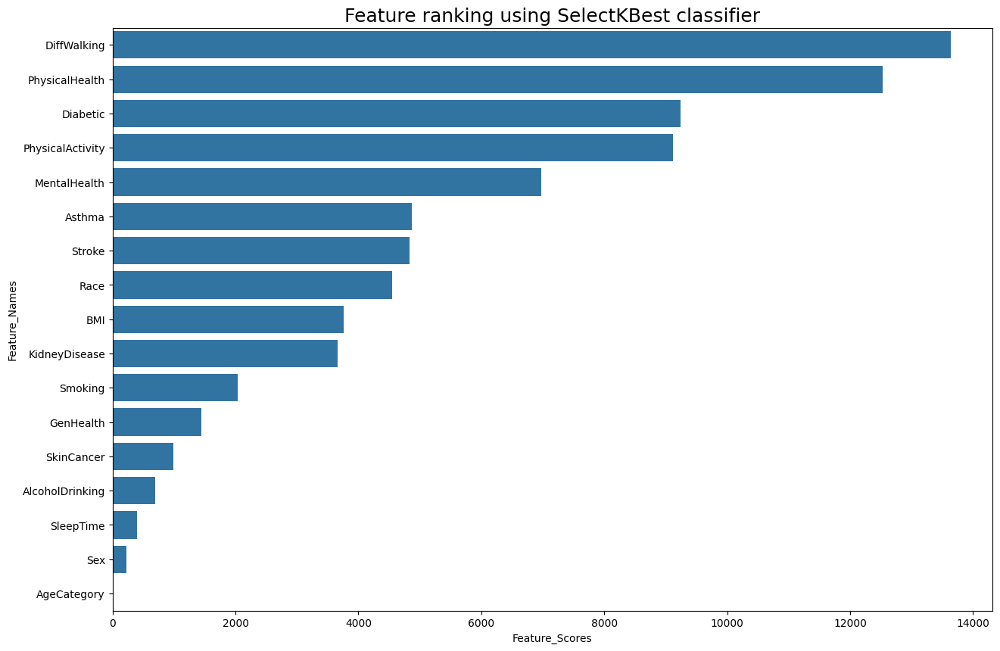

In [44]:
plt.figure(figsize=(15,10))
sns.barplot(x='Feature_Scores',y='Feature_Names',data=new)
plt.title('Feature ranking using SelectKBest classifier',fontsize=18)

# PCA (Phân tích thành phần chính)

In [45]:
# PCA (Phân tích thành phần chính)
from sklearn.preprocessing import MinMaxScaler

In [46]:
# Tạo đối tượng MinMaxScaler và áp dụng chuẩn hóa dữ liệu
mmx = MinMaxScaler() 
scaled_x = mmx.fit_transform(new_x)

In [47]:
# Sử dụng PCA để giảm chiều dữ liệu
from sklearn.decomposition import PCA

In [48]:
# Chọn số lượng thành phần chính là 3
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [49]:
x_pca

array([[-0.66189778, -0.02120894,  0.29702488],
       [-0.25531847,  0.6498457 , -0.31888643],
       [-0.37867518, -0.74643734, -0.25384386],
       ...,
       [-0.23144408,  0.65957632, -0.28594832],
       [ 0.30978133, -0.11683497, -0.80244112],
       [ 1.24147939,  0.43433291,  0.48569291]], shape=(54746, 3))

In [50]:
# Tạo DataFrame chứa các thành phần chính (pca1, pca2, pca3)
features = pd.DataFrame(x_pca, columns=['pca1', 'pca2', 'pca3'])

In [51]:
# Trực quan hóa dữ liệu PCA bằng đồ họa 3D sử dụng Plotly
import plotly.express as pl
pl.scatter_3d(features, x='pca1', y='pca2', z='pca3', color='pca1')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'pca1=%{marker.color}<br>pca2=%{y}<br>pca3=%{z}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': array([-0.66189778, -0.25531847, -0.37867518, ..., -0.23144408,  0.30978133,
                                          1.24147939], shape=(54746,)),
                         'coloraxis': 'coloraxis',
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'scene': 'scene',
              'showlegend': False,
              'type': 'scatter3d',
              'x': array([-0.66189778, -0.25531847, -0.37867518, ..., -0.23144408,  0.30978133,
                           1.24147939], shape=(54746,)),
              'y': array([-0.02120894,  0.6498457 , -0.74643734, ...,  0.65957632, -0.11683497,
                           0.43433291], shape=(54746,)),
              'z': array([ 0.29702488, -0.31888643, -0.25384386, ..., -0.28594832, -0.80244112,
                           0.48569291], shape=(54746,))}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'pca1'}},
                             'colorscale': [[0.0, '#0d0887'], [0.1111111111111111,
                                            '#46039f'], [0.2222222222222222,
                                            '#7201a8'], [0.3333333333333333,
                                            '#9c179e'], [0.4444444444444444,
                                            '#bd3786'], [0.5555555555555556,
                                            '#d8576b'], [0.6666666666666666,
                                            '#ed7953'], [0.7777777777777778,
                                            '#fb9f3a'], [0.8888888888888888,
                                            '#fdca26'], [1.0, '#f0f921']]},
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'scene': {'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'title': {'text': 'pca1'}},
                         'yaxis': {'title': {'text': 'pca2'}},
                         'zaxis': {'title': {'text': 'pca3'}}},
               'template': '...'}
})

# EDA for Balanced Data

<Axes: xlabel='Smoking', ylabel='count'>

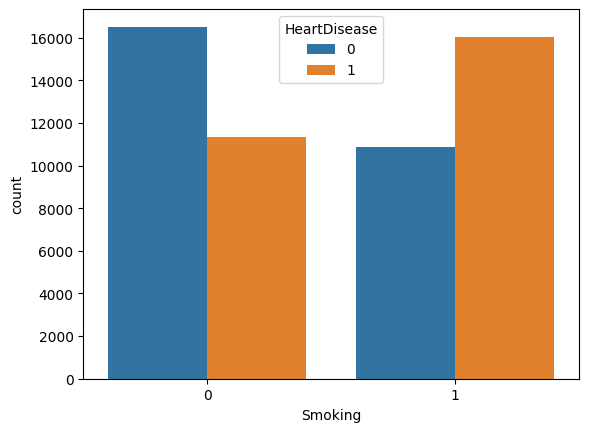

In [52]:
sns.countplot(x='Smoking',hue='HeartDisease',data=df4)

<Figure size 1500x1000 with 0 Axes>

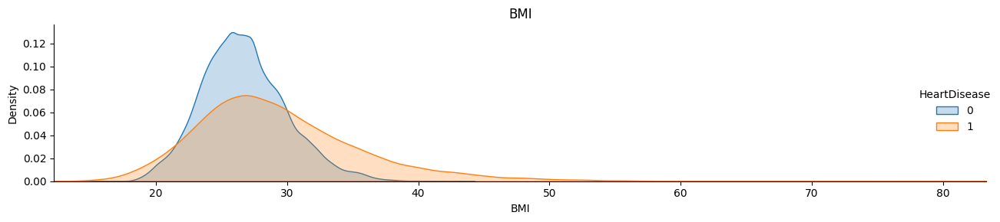

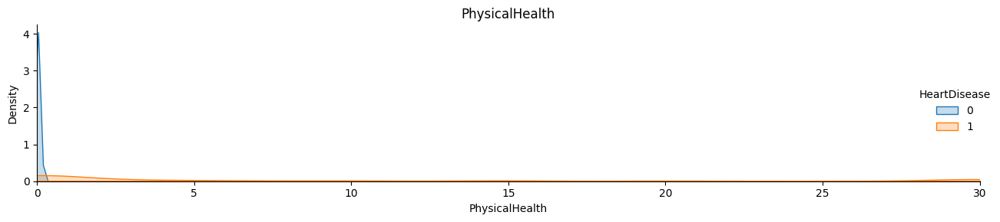

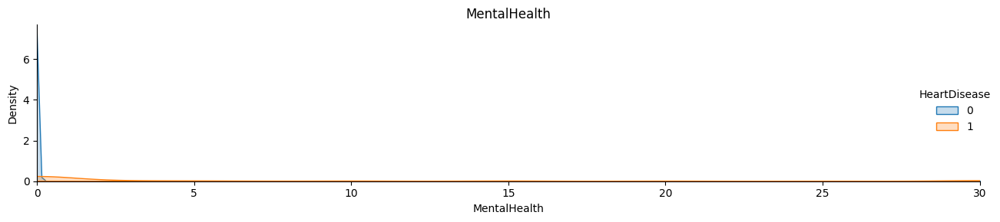

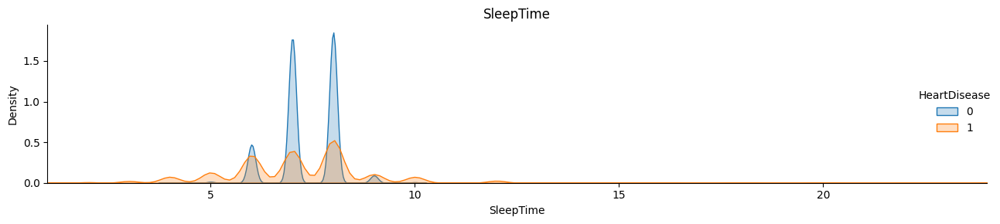

In [53]:
# KDE PLOTS
def plot_multiple_kdes(features, rows, cols, figsize=(15, 10)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    for i, feature in enumerate(features):
        facet = sns.FacetGrid(df4, hue="HeartDisease", aspect=4, height=3)
        facet.map(sns.kdeplot, feature, shade=True)
        facet.set(xlim=(df4[feature].min(), df4[feature].max()))
        facet.add_legend()
        facet.ax.set_title(f'{feature}')
        facet.ax.figure.tight_layout()
        axes[i].remove()
    plt.show()

kde_features = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
plot_multiple_kdes(kde_features, rows=2, cols=2)

In [54]:
df4.corr()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
BMI,1.000000,0.049441,0.014670,0.068767,0.192687,0.145983,0.257873,0.066262,-0.185498,-0.114441,0.293306,-0.210051,-0.031508,-0.067029,0.164275,0.120651,-0.018091,0.253337
Smoking,0.049441,1.000000,0.092053,0.076455,0.133507,0.112300,0.128243,0.101611,0.005786,-0.028858,0.099076,-0.128546,-0.014393,-0.025905,0.067483,0.042515,0.026792,0.189340
AlcoholDrinking,0.014670,0.092053,1.000000,0.024267,0.039746,0.072052,0.026511,0.008041,-0.059917,-0.012962,-0.007564,-0.042995,-0.000983,-0.002374,0.024382,0.000318,0.009680,0.111989
Stroke,0.068767,0.076455,0.024267,1.000000,0.236168,0.171132,0.256971,-0.045099,0.015393,-0.140675,0.169159,-0.172935,-0.067838,-0.018876,0.132583,0.137583,0.043969,0.284882
PhysicalHealth,0.192687,0.133507,0.039746,0.236168,1.000000,0.440993,0.520376,-0.089319,-0.039676,-0.149459,0.264498,-0.365403,-0.082941,-0.105898,0.240992,0.237105,0.053826,0.431588
MentalHealth,0.145983,0.112300,0.072052,0.171132,0.440993,1.000000,0.325887,-0.114732,-0.168178,-0.156602,0.169367,-0.237850,-0.065910,-0.138065,0.209618,0.137120,0.013027,0.336057
DiffWalking,0.257873,0.128243,0.026511,0.256971,0.520376,0.325887,1.000000,-0.134294,0.070244,-0.178967,0.300179,-0.412700,-0.113529,-0.075224,0.245212,0.240233,0.068561,0.446543
Sex,0.066262,0.101611,0.008041,-0.045099,-0.089319,-0.114732,-0.134294,1.000000,-0.114715,0.071277,-0.004047,0.099627,-0.016024,0.018666,-0.100898,-0.046308,0.066207,-0.063767
AgeCategory,-0.185498,0.005786,-0.059917,0.015393,-0.039676,-0.168178,0.070244,-0.114715,1.000000,0.128077,0.034799,-0.061437,0.048086,0.165630,-0.096953,0.046253,0.217923,0.006225
Race,-0.114441,-0.028858,-0.012962,-0.140675,-0.149459,-0.156602,-0.178967,0.071277,0.128077,1.000000,-0.170362,0.143604,0.073850,0.066569,-0.141057,-0.085409,0.079320,-0.276996


<Axes: >

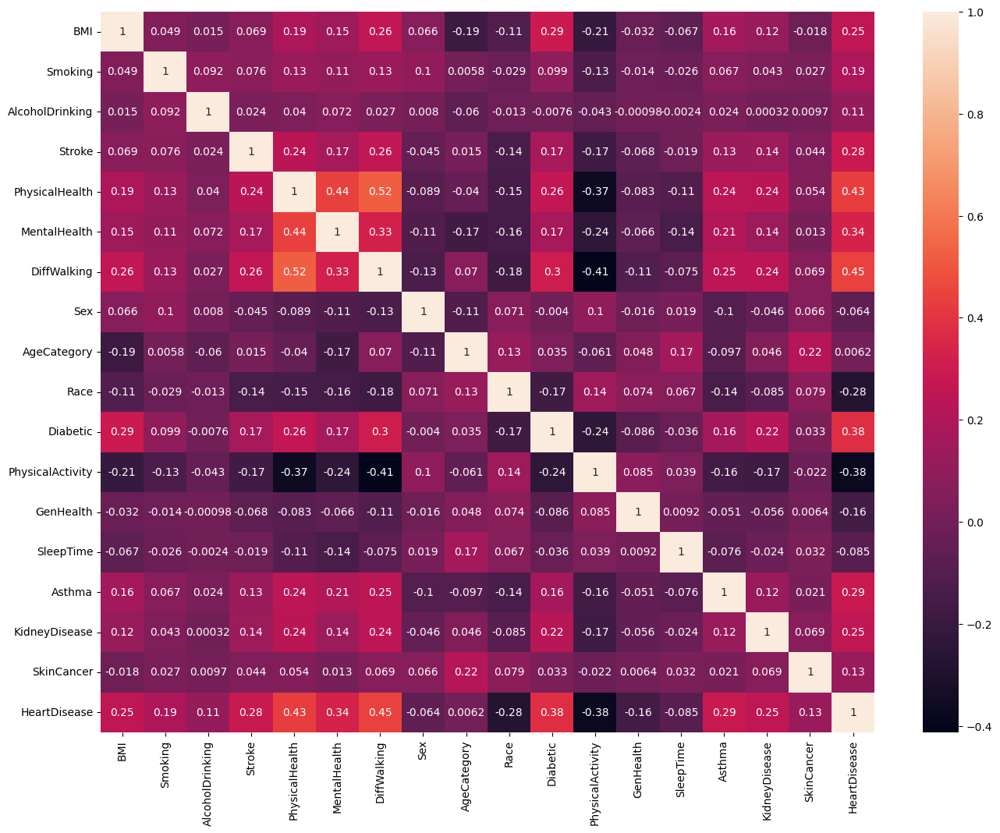

In [55]:
plt.figure(figsize=(16,12))
sns.heatmap(df4.corr(),annot=True)

# Modeling

In [56]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import gradio as gr

In [57]:
# Function to train, predict, and evaluate a model
def evaluate_model(model, model_name, X_train, y_train, X_test, y_test):
    """
    Train, predict, and evaluate a machine learning model.
    """
    model.fit(X_train, y_train)
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)

    train_acc = accuracy_score(y_train, train_pred)
    test_acc = accuracy_score(y_test, test_pred)

    print(f"{model_name} Accuracy on Train Data: {train_acc:.5f}")
    print(f"{model_name} Accuracy on Test Data: {test_acc:.5f}")
    print(f"{model_name} Classification Report:\n", classification_report(y_test, test_pred))

    cm = confusion_matrix(y_test, test_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm", cbar=False)
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Check if the model supports predict_proba
    if hasattr(model, "predict_proba"):
        return test_acc, model.predict_proba(X_test)
    else:
        print(f"{model_name} does not support probability predictions.")
        return test_acc, None

# Function to plot ROC Curve
def plot_roc_curve(y_test, probs, model_name):
    """
    Plot the ROC Curve for a given model.
    """
    if probs is not None:
        fpr, tpr, _ = roc_curve(y_test, probs[:, 1])
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='blue', lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve for {model_name}")
        plt.legend(loc="lower right")
        plt.show()

In [58]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(new_x, new_y, train_size=0.75, random_state=42)

In [70]:
X_test

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
13501,26.54,0,0,0,0,0,0,1,6,5,0,1,0,7,0,0,0
15356,25.46,0,0,0,0,0,0,1,12,5,0,1,2,7,0,0,1
11209,31.63,1,0,0,0,0,0,1,11,5,2,1,4,8,0,0,0
13251,23.63,1,0,0,0,0,0,0,7,5,0,1,4,7,0,0,0
27143,25.62,0,0,0,0,0,0,1,8,5,0,1,2,6,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16413,25.85,0,0,0,0,0,0,0,9,5,0,1,0,7,0,0,0
15499,24.01,0,0,0,0,0,0,1,9,5,0,1,0,8,0,0,0
28008,31.31,1,0,0,0,0,0,1,10,5,2,1,2,5,1,0,1
53629,31.87,1,0,1,1,0,1,1,12,5,2,0,4,8,0,0,0


In [71]:
y_test

13501    0
15356    0
11209    0
13251    0
27143    0
        ..
16413    0
15499    0
28008    1
53629    1
20790    0
Name: HeartDisease, Length: 13687, dtype: int64

Created dataset file at: .gradio\flagged\dataset1.csv


In [59]:
# Dictionary of models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "SVM": SVC(kernel='linear', probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42)
}

Evaluating Logistic Regression...
Logistic Regression Accuracy on Train Data: 0.87508
Logistic Regression Accuracy on Test Data: 0.87718
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.94      0.88      6825
           1       0.93      0.81      0.87      6862

    accuracy                           0.88     13687
   macro avg       0.88      0.88      0.88     13687
weighted avg       0.88      0.88      0.88     13687



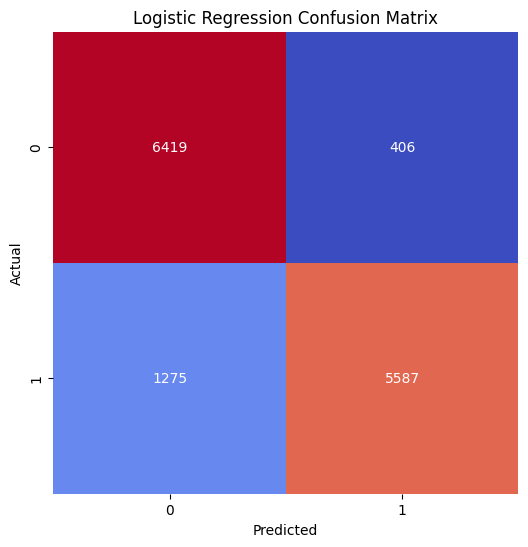

Evaluating Decision Tree...
Decision Tree Accuracy on Train Data: 0.98307
Decision Tree Accuracy on Test Data: 0.84262
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.85      0.84      6825
           1       0.85      0.83      0.84      6862

    accuracy                           0.84     13687
   macro avg       0.84      0.84      0.84     13687
weighted avg       0.84      0.84      0.84     13687



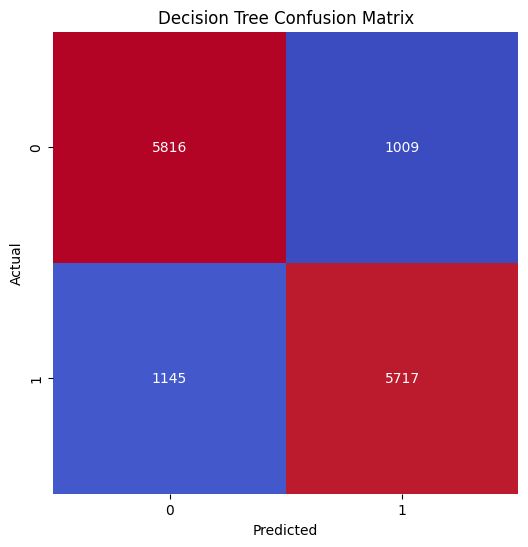

Evaluating XGBoost...
XGBoost Accuracy on Train Data: 0.90998
XGBoost Accuracy on Test Data: 0.89691
XGBoost Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.94      0.90      6825
           1       0.94      0.85      0.89      6862

    accuracy                           0.90     13687
   macro avg       0.90      0.90      0.90     13687
weighted avg       0.90      0.90      0.90     13687



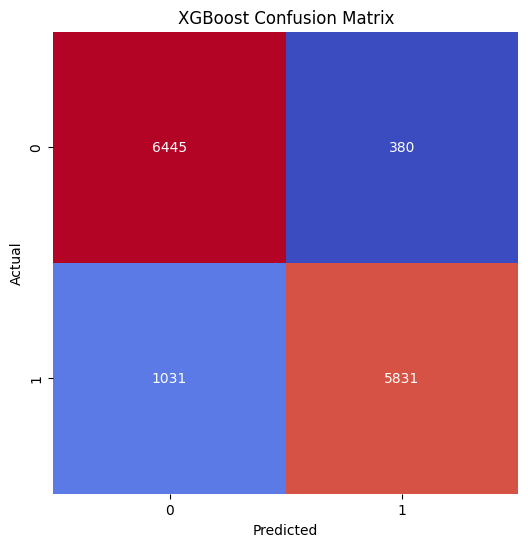

Evaluating AdaBoost...
AdaBoost Accuracy on Train Data: 0.86398
AdaBoost Accuracy on Test Data: 0.86688
AdaBoost Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.95      0.88      6825
           1       0.94      0.79      0.86      6862

    accuracy                           0.87     13687
   macro avg       0.88      0.87      0.87     13687
weighted avg       0.88      0.87      0.87     13687



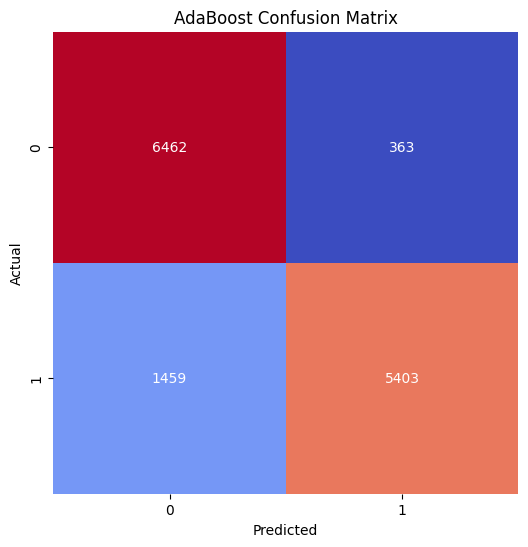

Evaluating K-Nearest Neighbors...
K-Nearest Neighbors Accuracy on Train Data: 0.87905
K-Nearest Neighbors Accuracy on Test Data: 0.84767
K-Nearest Neighbors Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.95      0.86      6825
           1       0.93      0.75      0.83      6862

    accuracy                           0.85     13687
   macro avg       0.86      0.85      0.85     13687
weighted avg       0.86      0.85      0.85     13687



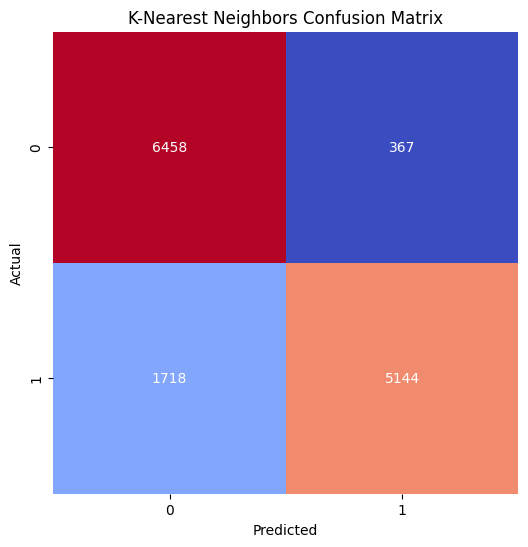

Evaluating SVM...
SVM Accuracy on Train Data: 0.86683
SVM Accuracy on Test Data: 0.86820
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.91      0.87      6825
           1       0.90      0.83      0.86      6862

    accuracy                           0.87     13687
   macro avg       0.87      0.87      0.87     13687
weighted avg       0.87      0.87      0.87     13687



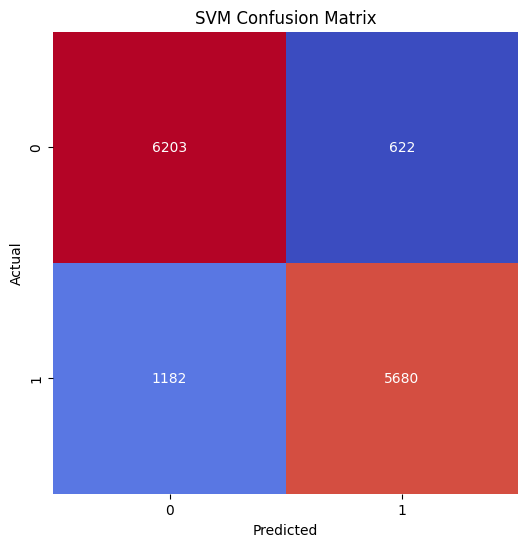

Evaluating Random Forest...
Random Forest Accuracy on Train Data: 0.98307
Random Forest Accuracy on Test Data: 0.85344
Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.86      0.85      6825
           1       0.86      0.84      0.85      6862

    accuracy                           0.85     13687
   macro avg       0.85      0.85      0.85     13687
weighted avg       0.85      0.85      0.85     13687



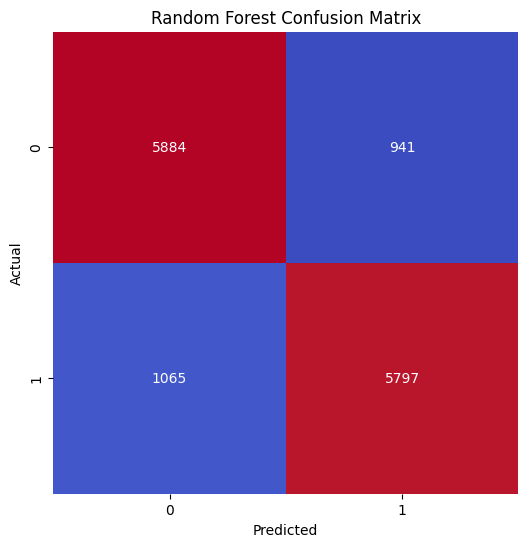

In [60]:
# Evaluate each model
accuracies = []
model_names = []
roc_curves = []

for name, model in models.items():
    print(f"Evaluating {name}...")
    acc, probs = evaluate_model(model, name, X_train, y_train, X_test, y_test)
    accuracies.append(acc)
    model_names.append(name)
    if probs is not None:
        roc_curves.append((y_test, probs, name))

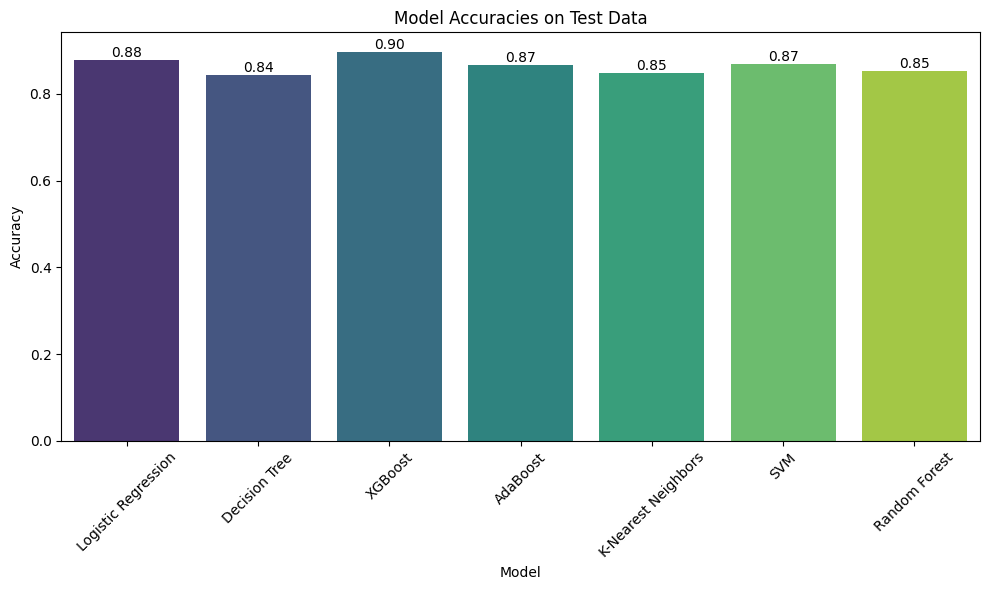

In [61]:
# Bar plot for accuracies
plt.figure(figsize=(10, 6))
sns.barplot(x=model_names, y=accuracies, palette="viridis")
plt.xticks(rotation=45)
plt.title("Model Accuracies on Test Data")
plt.ylabel("Accuracy")
plt.xlabel("Model")

# Add accuracy values above bars
for i, acc in enumerate(accuracies):
    plt.text(i, acc, f"{acc:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

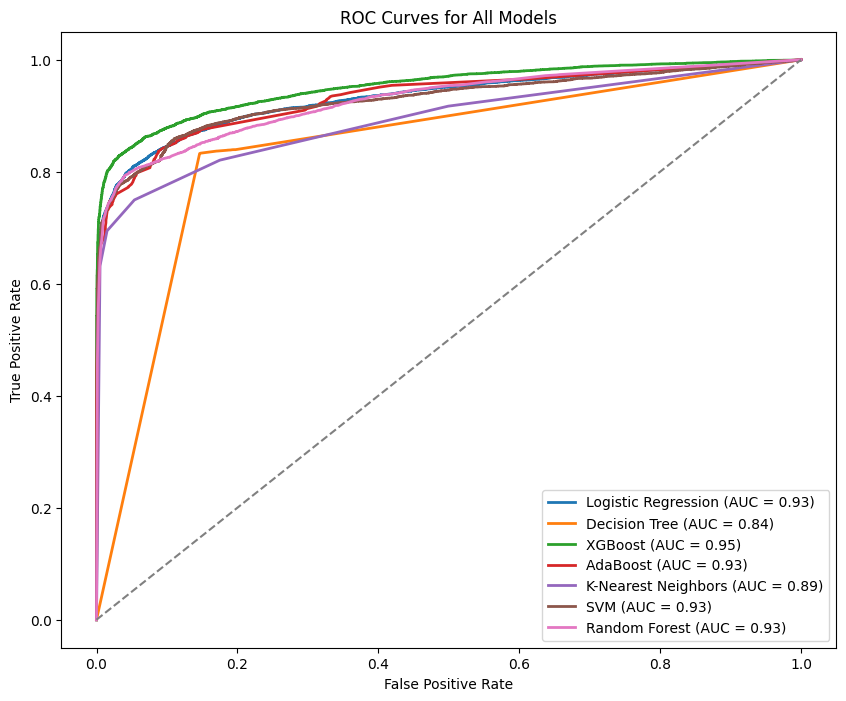

In [62]:
# Plot all ROC Curves
plt.figure(figsize=(10, 8))
for y_test, probs, name in roc_curves:
    fpr, tpr, _ = roc_curve(y_test, probs[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for All Models")
plt.legend(loc="lower right")
plt.show()

In [63]:
# Choose the best model based on accuracy
best_model_name, best_acc = max(zip(model_names, accuracies), key=lambda x: x[1])
best_model = models[best_model_name]
print(f"Best Model: {best_model_name} with Accuracy: {best_acc:.5f}")

Best Model: XGBoost with Accuracy: 0.89691


# Gradio deployment

In [67]:
# Deployment with Gradio
def heart(BMI, Smoking, AlcoholDrinking, Stroke, PhysicalHealth, MentalHealth, DiffWalking, Sex, AgeCategory, Race, Diabetic, PhysicalActivity, GenHealth, SleepTime, Asthma, KidneyDisease, SkinCancer):
    HeartDisease = best_model.predict([[BMI, Smoking, AlcoholDrinking, Stroke, PhysicalHealth, MentalHealth, DiffWalking, Sex, AgeCategory, Race, Diabetic, PhysicalActivity, GenHealth, SleepTime, Asthma, KidneyDisease, SkinCancer]])
    return "Positive for Heart Disease" if HeartDisease[0] == 1 else "Negative for Heart Disease"

In [68]:
heart(26.54,0,0,0,0,0,0,1,6,5,0,1,0,7,0,0,0)

'Negative for Heart Disease'

In [69]:
interface = gr.Interface(
    fn=heart,
    inputs=['number', 'number', 'number', 'number', 'number', 'number', 'number', 'number', 'number',
            'number', 'number', 'number', 'number', 'number', 'number', 'number', 'number'],
    outputs='text'
)

interface.launch(share=False)

* Running on local URL:  http://127.0.0.1:7861

To create a public link, set `share=True` in `launch()`.
